In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from xgboost import XGBRegressor as XGB
from sklearn.metrics import mean_absolute_error as mae
SEED=42

from src.styles import *
set_styles()

In [3]:
df_train = pd.read_csv('data/train.csv')
df_train['datetime'] = pd.to_datetime(df_train['datetime'])
df_train

,county,is_business,product_type,target,is_consumption,datetime,data_block_id,row_id,prediction_unit_id
0,0,0,1,0.713,0,2021-09-01 00:00:00,0,0,0
1,0,0,1,96.590,1,2021-09-01 00:00:00,0,1,0
2,0,0,2,0.000,0,2021-09-01 00:00:00,0,2,1
3,0,0,2,17.314,1,2021-09-01 00:00:00,0,3,1
4,0,0,3,2.904,0,2021-09-01 00:00:00,0,4,2
...,...,...,...,...,...,...,...,...,...
2018347,15,1,0,197.233,1,2023-05-31 23:00:00,637,2018347,64
2018348,15,1,1,0.000,0,2023-05-31 23:00:00,637,2018348,59
2018349,15,1,1,28.404,1,2023-05-31 23:00:00,637,2018349,59
2018350,15,1,3,0.000,0,2023-05-31 23:00:00,637,2018350,60


In [4]:
df_train.groupby(['county', 'is_business', 'product_type', 'is_consumption'])['target'].count()

county  is_business  product_type  is_consumption
0       0            1             0                 15308
                                   1                 15308
                     2             0                 15308
                                   1                 15308
                     3             0                 15308
                                                     ...  
15      1            0             1                 13125
                     1             0                 15308
                                   1                 15308
                     3             0                 15308
                                   1                 15308
Name: target, Length: 138, dtype: int64

# Target

In [ ]:
def show_target(df_train, is_cons, is_bus, prod, county, day0, day1):
    df = df_train.query(f'(is_consumption == {is_cons}) & (is_business == {is_bus}) & (product_type == {prod}) & (county == {county})')

    df = df.loc[(df['data_block_id'] >= day0) & (df['data_block_id'] < day1)].reset_index(drop=True)

    _, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 3))

    sns.lineplot(x=df.index + day0*24, y=df['target'], ax=ax, color=PALETTE[0])
    ax.grid(True)
    ax.set_title(f'is_consumption {is_cons}, is_business {is_bus}, product_type {prod}, county {county}', fontsize=12)
    ax.set_xticks(df['data_block_id'].unique()*24, df['data_block_id'].unique())
    ax.set_xlabel('data_block_id')

    plt.tight_layout()
    plt.savefig(f'{is_cons}_{is_bus}_{prod}_{county}_[{day0},{day1}].png')
    plt.show()

In [ ]:
show_target(df_train, 0,0,1,0, 0,25)
show_target(df_train, 0,1,2,10, 0,25)
show_target(df_train, 1,0,1,3, 0,25)
show_target(df_train, 1,1,3,7, 0,25)

# Target daily sum

In [ ]:
def show_target_daily(df_train, is_cons, is_bus, prod, county):
    df = df_train.query(f'(is_consumption == {is_cons}) & (is_business == {is_bus}) & (product_type == {prod}) & (county == {county})')
    df  = df.groupby(['data_block_id']) \
            .agg({'target': 'sum'}) \
            .unstack() 
    
    df.index = df.index.get_level_values(1)

    _, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 3))
    
    sns.scatterplot(x=df.index, y=df.values, ax=ax, color=PALETTE[0])
    ax.grid(True)
    ax.set_title(f'is_consumption {is_cons}, is_business {is_bus}, product_type {prod}, county {county}', fontsize=12)
    ax.set_xticks(df.index[::100], df.index[::100])
    ax.set_xlabel('data_block_id')

    plt.tight_layout()
    plt.savefig(f'{is_cons}_{is_bus}_{prod}_{county}_aggday.png')
    plt.show()

In [ ]:
show_target_daily(df_train, 0,0,1,2)
show_target_daily(df_train, 0,1,0,4)
show_target_daily(df_train, 1,0,3,0)
show_target_daily(df_train, 1,1,3,5)

# Target / installed_capacity

In [7]:
df_client = pd.read_csv('data/client.csv')
df_client

,product_type,county,eic_count,installed_capacity,is_business,date,data_block_id
0,1,0,108,952.89,0,2021-09-01,2
1,2,0,17,166.40,0,2021-09-01,2
2,3,0,688,7207.88,0,2021-09-01,2
3,0,0,5,400.00,1,2021-09-01,2
4,1,0,43,1411.00,1,2021-09-01,2
...,...,...,...,...,...,...,...
41914,1,15,51,415.60,0,2023-05-29,637
41915,3,15,161,2035.75,0,2023-05-29,637
41916,0,15,15,620.00,1,2023-05-29,637
41917,1,15,20,624.50,1,2023-05-29,637


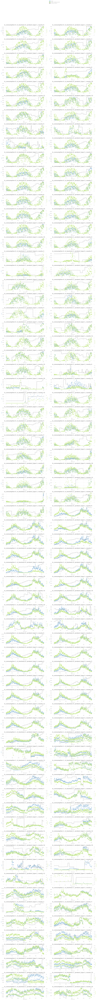

CPU times: total: 1min 9s
Wall time: 1min 20s


In [25]:
%%time

fig, axes = plt.subplots(nrows=69, ncols=2, figsize=(20, 200))
axes= axes.ravel()

nn = 0
for consumption in [0, 1]:
    for business in [0, 1]:
        for product in [0, 1, 2, 3]:
            for county in range(16):
                df = df_train.query(f'(is_consumption == {consumption}) & (is_business == {business}) & (product_type == {product}) & (county == {county})')
                if df.shape[0] > 0:
                    df  = df.groupby(['data_block_id', 'county']) \
                            .agg({'target': 'sum'}) \
                            .unstack() \
                            .reset_index()                            
                    
                    df.columns = ['data_block_id', 'target']
                    df_cl = df_client.query(f'(is_business == {business}) & (product_type == {product}) & (county == {county})')
                    df = df.merge(df_cl[['data_block_id', 'installed_capacity']], on='data_block_id', how='left').fillna(method='ffill').fillna(method='bfill')

                    ax = axes[nn]
                    ax_cap = axes[nn].twinx()
                    ax_tr = axes[nn].twinx()
                    sns.lineplot(x=df.index, y=df['installed_capacity'], ax=ax_cap, color='gray')
                    sns.scatterplot(x=df.index, y=df['target'], ax=ax, color=PALETTE[0])
                    sns.scatterplot(x=df.index, y=df['target'] / df['installed_capacity'], ax=ax_tr, color=PALETTE[2])
                    ax.grid(True)
                    ax.set_title(f'is_consumption {consumption}, is_business {business}, product_type {product}, county {county}')
                    ax.set_ylabel('target', color=PALETTE[0])
                    ax.set_xlabel('data_block_id')
                    ax_cap.set_ylabel(None)
                    ax_cap.set_yticklabels([])
                    ax_tr.set_ylabel('transformed', color=PALETTE[2])
                    nn+=1



import matplotlib.patches as mpatches
tar_patch = mpatches.Patch(color=PALETTE[0], label='target')
tr_patch = mpatches.Patch(color=PALETTE[2], label='target / installed_capacity')
cap_patch = mpatches.Patch(color='gray', label='installed_capacity')
fig.legend(handles=[tar_patch, tr_patch, cap_patch], bbox_to_anchor=(0.5, 1.02, 0.5, .02), loc='lower left')
plt.tight_layout()
plt.show()

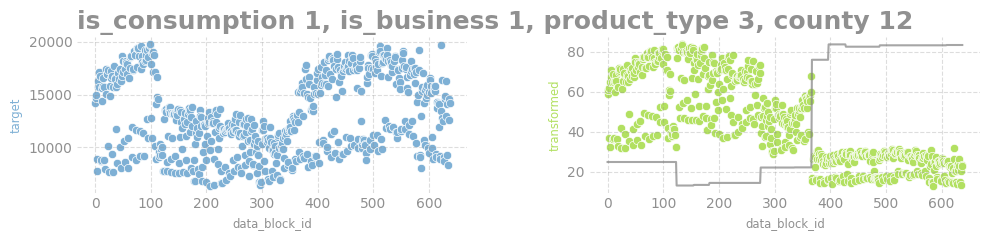

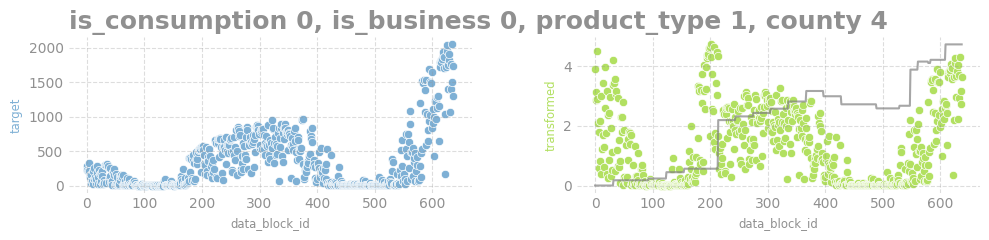

In [24]:
data_typical = ((1,0,3,0),
                (0,0,1,2),
                (0,1,0,4),
                (1,1,3,5),
                (1,1,1,14),
)
data_better =  ((0,0,2,11),
                (0,1,1,3),
                (0,1,1,7),
)
data_worse =   ((1,1,3,12),
                (0,0,1,4),
)

for nn, (consumption, business, product, county) in enumerate(data_worse):
    df = df_train.query(f'(is_consumption == {consumption}) & (is_business == {business}) & (product_type == {product}) & (county == {county})')
    if df.shape[0] > 0:
        df  = df.groupby(['data_block_id', 'county']) \
                .agg({'target': 'sum'}) \
                .unstack() \
                .reset_index()                            
        
        df.columns = ['data_block_id', 'target']
        df_cl = df_client.query(f'(is_business == {business}) & (product_type == {product}) & (county == {county})')
        df = df.merge(df_cl[['data_block_id', 'installed_capacity']], on='data_block_id', how='left').fillna(method='ffill').fillna(method='bfill')

        _,axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 2.5))
        axes = axes.ravel()

        ax = axes[0]
        ax_cap = axes[1].twinx()
        ax_tr = axes[1]
        sns.lineplot(x=df.index, y=df['installed_capacity'], ax=ax_cap, color='gray', alpha=0.7)
        sns.scatterplot(x=df.index, y=df['target'], ax=ax, color=PALETTE[0])
        sns.scatterplot(x=df.index, y=df['target'] / df['installed_capacity'], ax=ax_tr, color=PALETTE[2])
        ax.grid(True)
        ax.set_title(f'is_consumption {consumption}, is_business {business}, product_type {product}, county {county}')
        ax.set_ylabel('target', color=PALETTE[0])
        ax.set_xlabel('data_block_id')
        ax_cap.set_ylabel(None)
        ax_cap.set_yticklabels([])
        ax_tr.grid(True)
        ax_tr.set_ylabel('transformed', color=PALETTE[2])
        ax_tr.set_xlabel('data_block_id')

        plt.tight_layout()
        plt.savefig(f'transformed_worse_{consumption}_{business}_{product}_{county}.png')
        plt.show()